In [1]:
#Import all relevant libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore
import sweetviz as sv
from ydata_profiling import ProfileReport 

%matplotlib inline

In [2]:
df = pd.read_csv("final_data.csv")
df.head()

,player,team,name,position,height,age,appearance,goals,assists,yellow cards,...,goals conceded,clean sheets,minutes played,days_injured,games_injured,award,current_value,highest_value,position_encoded,winger
0,/david-de-gea/profil/spieler/59377,Manchester United,David de Gea,Goalkeeper,189.0,32.0,104,0.000000,0.000000,0.009585,...,1.217252,0.335463,9390,42,5,13,15000000,70000000,1,0
1,/jack-butland/profil/spieler/128899,Manchester United,Jack Butland,Goalkeeper,196.0,30.0,15,0.000000,0.000000,0.069018,...,1.242331,0.207055,1304,510,58,1,1500000,22000000,1,0
2,/tom-heaton/profil/spieler/34130,Manchester United,Tom Heaton,Goalkeeper,188.0,37.0,4,0.000000,0.000000,0.000000,...,0.616438,0.924658,292,697,84,4,600000,6000000,1,0
3,/lisandro-martinez/profil/spieler/480762,Manchester United,Lisandro Martínez,Defender Centre-Back,175.0,25.0,82,0.028090,0.056180,0.224719,...,0.000000,0.000000,6408,175,22,9,50000000,50000000,2,0
4,/raphael-varane/profil/spieler/164770,Manchester United,Raphaël Varane,Defender Centre-Back,191.0,30.0,63,0.017889,0.017889,0.053667,...,0.000000,0.000000,5031,238,51,21,40000000,80000000,2,0


## Relevance

In [4]:
df.head(2)

,player,team,name,position,height,age,appearance,goals,assists,yellow cards,...,goals conceded,clean sheets,minutes played,days_injured,games_injured,award,current_value,highest_value,position_encoded,winger
0,/david-de-gea/profil/spieler/59377,Manchester United,David de Gea,Goalkeeper,189.0,32.0,104,0.0,0.0,0.009585,...,1.217252,0.335463,9390,42,5,13,15000000,70000000,1,0
1,/jack-butland/profil/spieler/128899,Manchester United,Jack Butland,Goalkeeper,196.0,30.0,15,0.0,0.0,0.069018,...,1.242331,0.207055,1304,510,58,1,1500000,22000000,1,0


In [5]:
df.drop(columns=['player','name'], inplace=True)

In [6]:
df.loc[:,['position','position_encoded','winger']]

,position,position_encoded,winger
0,Goalkeeper,1,0
1,Goalkeeper,1,0
2,Goalkeeper,1,0
3,Defender Centre-Back,2,0
4,Defender Centre-Back,2,0
...,...,...,...
10749,Attack-RightWinger,4,1
10750,Attack Centre-Forward,4,0
10751,Attack Centre-Forward,4,0
10752,Attack Centre-Forward,4,0


It is obvious that created two cols one called **position_encoded** and the second **winger** by using the main **position** col.


Goalkeeper = 1 in position_encoded col and **not** winger

Attack-RightWinger = 4	in position_encoded and winger

**So we can delete the position col before fitting data to model if the encoding was correct**

## Check Uniquness 

In [11]:
df.duplicated().sum()

0

## Check Mising Value

In [13]:
df.isnull().sum()

team                   0
position               0
height                 0
age                    0
appearance             0
goals                  0
assists                0
yellow cards           0
second yellow cards    0
red cards              0
goals conceded         0
clean sheets           0
minutes played         0
days_injured           0
games_injured          0
award                  0
current_value          0
highest_value          0
position_encoded       0
winger                 0
dtype: int64

## Handling the outliers

In [15]:
df.describe()

,height,age,appearance,goals,assists,yellow cards,second yellow cards,red cards,goals conceded,clean sheets,minutes played,days_injured,games_injured,award,current_value,highest_value,position_encoded,winger
count,10754.000000,10754.000000,10754.000000,10754.000000,10754.000000,10754.000000,10754.000000,10754.000000,10754.000000,10754.000000,10754.000000,10754.000000,10754.000000,10754.000000,1.075400e+04,1.075400e+04,10754.000000,10754.000000
mean,181.240353,26.041903,36.407011,0.125554,0.086978,0.189757,0.004666,0.006826,0.131655,0.044881,2470.789381,117.961689,15.826297,1.960759,3.622971e+06,6.152606e+06,2.713223,0.307513
std,6.969818,4.777629,26.526541,0.235585,0.143351,0.432388,0.025232,0.081143,0.442335,0.924437,2021.703271,175.206827,23.383606,3.743936,9.095410e+06,1.338988e+07,0.986356,0.461485
min,156.000000,15.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,1.000000,0.000000
25%,176.000000,22.000000,12.000000,0.000000,0.000000,0.053191,0.000000,0.000000,0.000000,0.000000,660.000000,0.000000,0.000000,0.000000,3.000000e+05,4.500000e+05,2.000000,0.000000
50%,181.240353,26.000000,35.000000,0.045969,0.040773,0.150250,0.000000,0.000000,0.000000,0.000000,2101.500000,37.000000,5.000000,1.000000,8.000000e+05,1.500000e+06,3.000000,0.000000
75%,186.000000,29.000000,59.000000,0.172263,0.133136,0.248276,0.000000,0.000000,0.000000,0.000000,3968.000000,181.000000,24.000000,2.000000,3.000000e+06,5.000000e+06,4.000000,1.000000
max,206.000000,43.000000,107.000000,11.250000,4.000000,30.000000,1.000000,6.923077,9.000000,90.000000,9510.000000,2349.000000,339.000000,92.000000,1.800000e+08,2.000000e+08,4.000000,1.000000


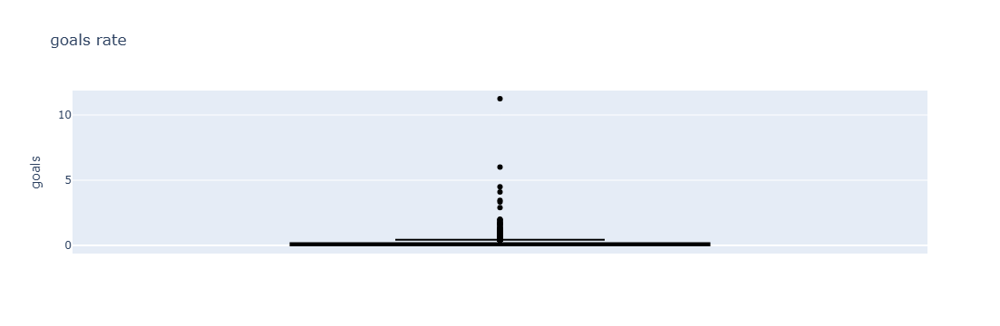

In [18]:
# Dealing with outliers for goal rates

import plotly.express as px
fig = px.box(df, y='goals', title='goals rate',color_discrete_sequence=px.colors.sequential.Blackbody)
fig.show()

In [25]:
df = df[df['goals'] < 1.2]

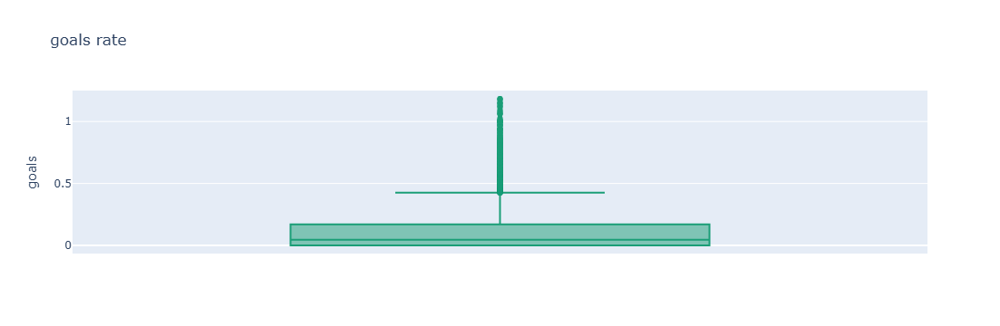

In [26]:
import plotly.express as px
fig = px.box(df, y='goals', title='goals rate',color_discrete_sequence=px.colors.colorbrewer.Dark2)
# Show the plot
fig.show()

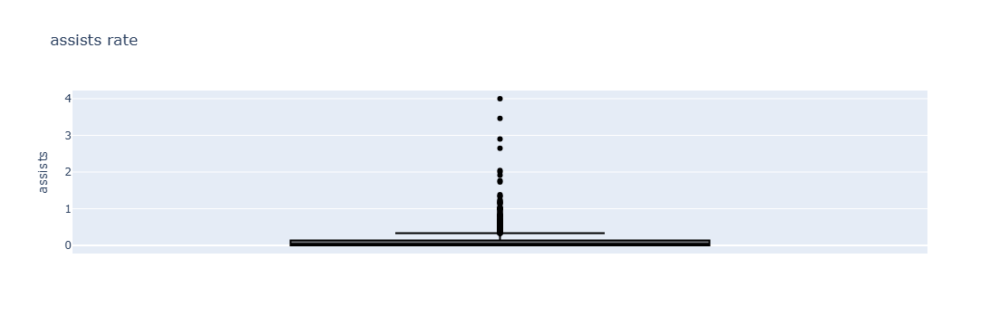

In [27]:
# Dealing with outliers for assists rates

import plotly.express as px
fig = px.box(df, y='assists', title='assists rate',color_discrete_sequence=px.colors.sequential.Blackbody)
fig.show()

In [28]:
df = df[df['assists'] < 0.6]

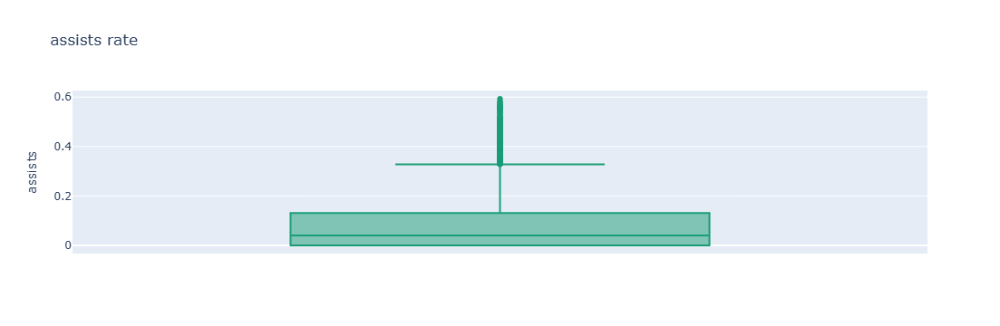

In [29]:

fig = px.box(df, y='assists', title='assists rate',color_discrete_sequence=px.colors.colorbrewer.Dark2)
# Show the plot
fig.show()

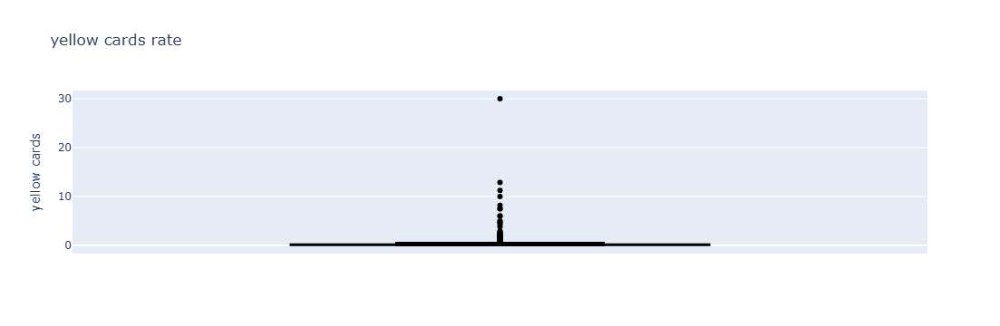

In [30]:
# Dealing with outliers for yellow cards

fig = px.box(df, y='yellow cards', title='yellow cards rate',color_discrete_sequence=px.colors.sequential.Blackbody)
fig.show()

In [31]:
df = df[df['yellow cards']<1]

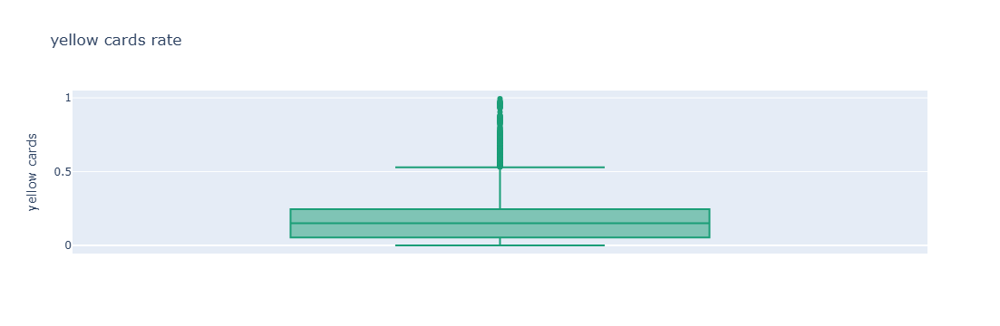

In [32]:
fig = px.box(df, y='yellow cards', title='yellow cards rate',color_discrete_sequence=px.colors.colorbrewer.Dark2)
# Show the plot
fig.show()

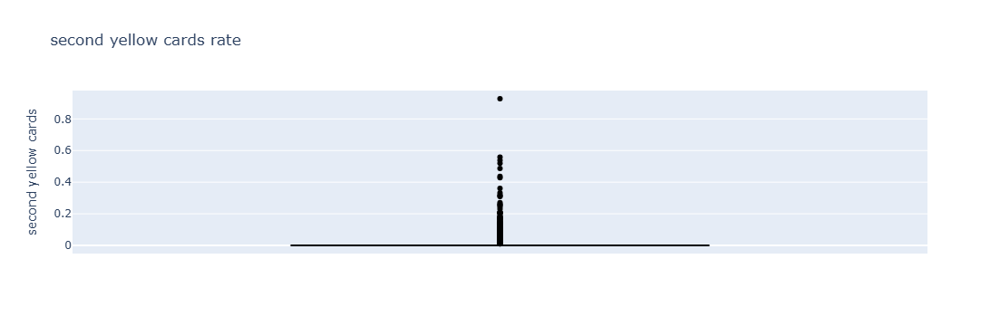

In [39]:
# Dealing with outliers for second yellow cards

fig = px.box(df, y='second yellow cards', title='second yellow cards rate',color_discrete_sequence=px.colors.sequential.Blackbody)
fig.show()

In [40]:
df = df[df['second yellow cards'] < .3]

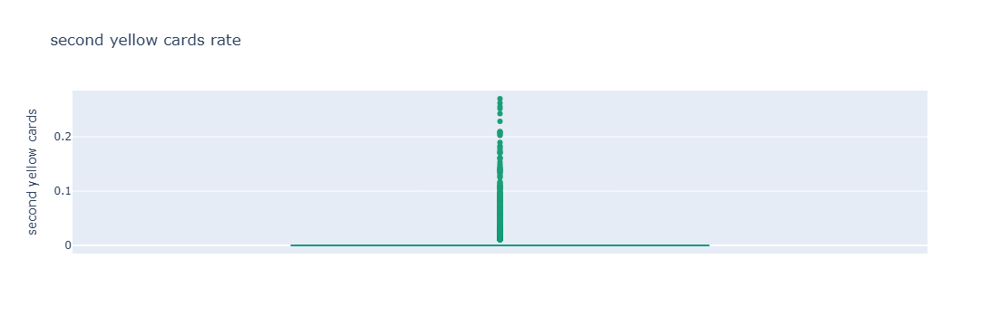

In [41]:
fig = px.box(df, y='second yellow cards', title='second yellow cards rate',color_discrete_sequence=px.colors.colorbrewer.Dark2)
# Show the plot
fig.show()

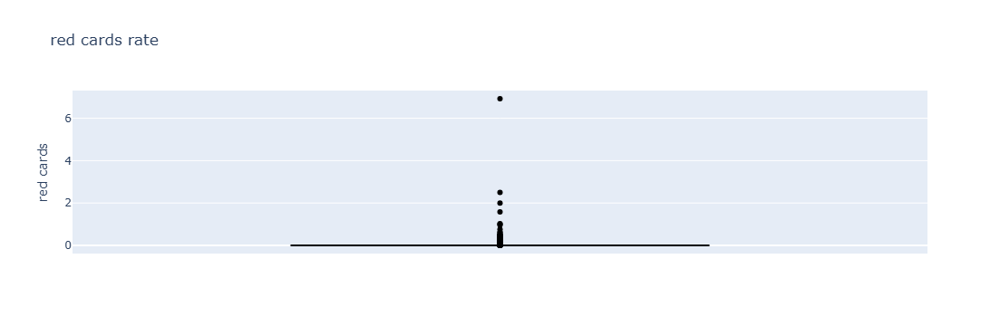

In [45]:
# Dealing with outliers for red cards

fig = px.box(df, y='red cards', title='red cards rate',color_discrete_sequence=px.colors.sequential.Blackbody)
fig.show()

In [50]:
df = df[df['red cards'] < 0.3]

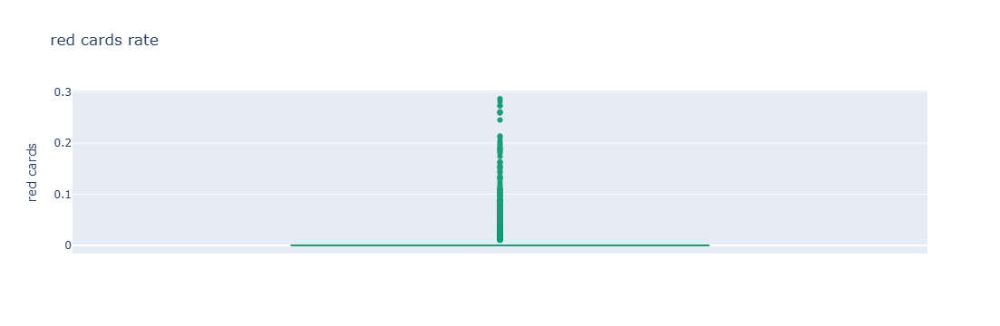

In [52]:
fig = px.box(df, y='red cards', title='red cards rate',color_discrete_sequence=px.colors.colorbrewer.Dark2)
# Show the plot
fig.show()

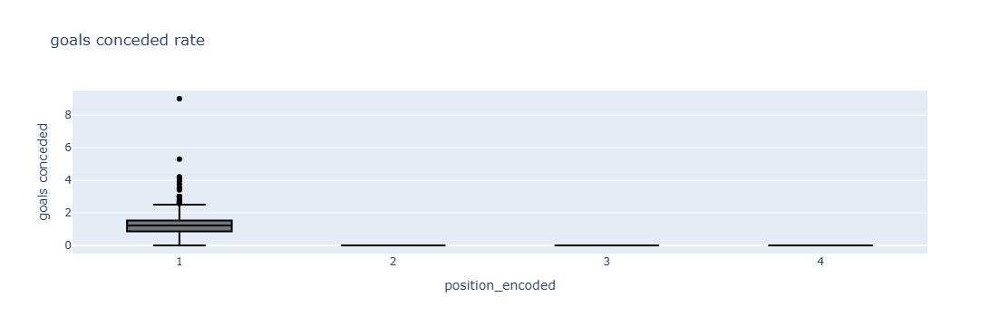

In [54]:
# Dealing with outliers for goals conceded

fig = px.box(df,x='position_encoded' ,y='goals conceded', title='goals conceded rate',color_discrete_sequence=px.colors.sequential.Blackbody)
fig.show()

In [56]:
df = df[(df['goals conceded'] < 3 )]

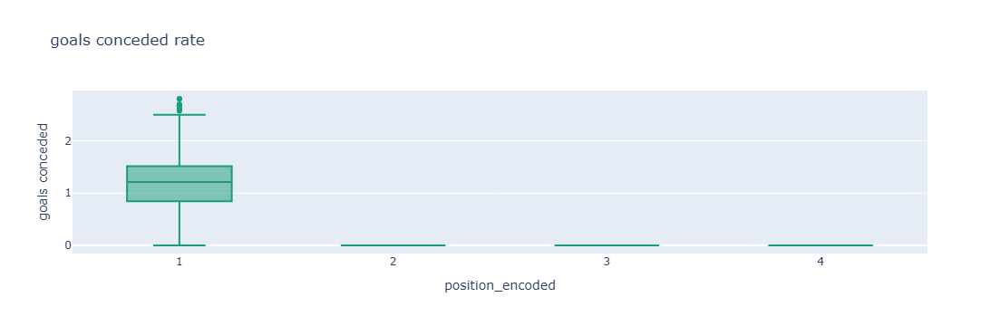

In [58]:
fig = px.box(df, x='position_encoded',y='goals conceded', title='goals conceded rate',color_discrete_sequence=px.colors.colorbrewer.Dark2)
# Show the plot
fig.show()

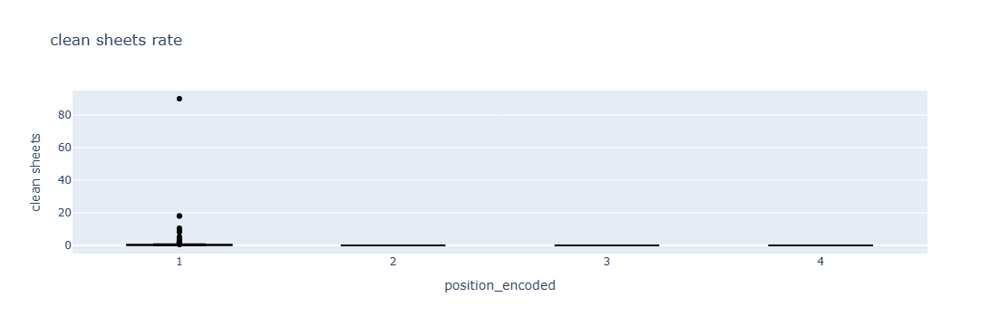

In [60]:
# Dealing with outliers for clean sheets	

fig = px.box(df,x= 'position_encoded', y='clean sheets', title='clean sheets rate',color_discrete_sequence=px.colors.sequential.Blackbody)
fig.show()

In [62]:
df = df[~((df['goals conceded'] > 0) & (df['clean sheets'] == 0) & (df['position_encoded'] == 1))]

In [65]:
df = df[~((df['clean sheets'] > .95) & (df['position_encoded'] == 1) & (df['position_encoded']< 10))]

In [67]:
df.shape

(10404, 20)

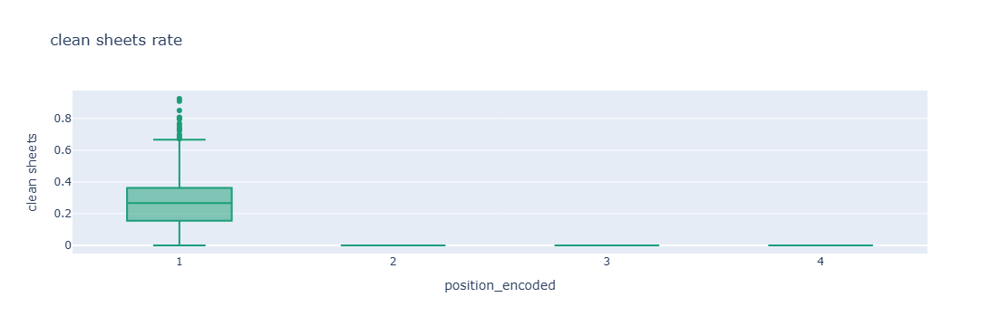

In [69]:
fig = px.box(df, x='position_encoded',y='clean sheets', title='clean sheets rate',color_discrete_sequence=px.colors.colorbrewer.Dark2)
# Show the plot
fig.show()

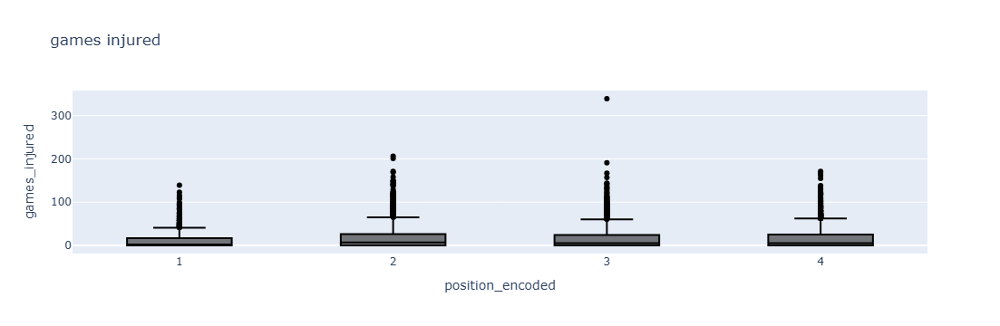

In [71]:
# Dealing with outliers for clean sheets	

fig = px.box(df,x= 'position_encoded', y='games_injured', title='games injured',color_discrete_sequence=px.colors.sequential.Blackbody)
fig.show()

In [73]:
df[df['games_injured'] > 100]

,team,position,height,age,appearance,goals,assists,yellow cards,second yellow cards,red cards,goals conceded,clean sheets,minutes played,days_injured,games_injured,award,current_value,highest_value,position_encoded,winger
7,Manchester United,Defender Centre-Back,185.0,31.0,8,0.000000,0.000000,0.216346,0.000000,0.000000,0.0,0.0,416,932,169,7,2000000,20000000,2,0
52,West Ham United,Attack Centre-Forward,177.0,30.0,74,0.389610,0.229183,0.183346,0.000000,0.000000,0.0,0.0,3927,721,116,2,16000000,22000000,4,0
65,Leicester City,Defender Left-Back,179.0,33.0,12,0.000000,0.000000,0.221675,0.000000,0.000000,0.0,0.0,812,872,129,4,1000000,20000000,2,1
128,Wolverhampton Wanderers,Attack Centre-Forward,200.0,25.0,19,0.359760,0.299800,0.179880,0.000000,0.000000,0.0,0.0,1501,1088,119,0,18000000,25000000,4,0
185,Brighton &amp; Hove Albion,Attack Centre-Forward,185.0,32.0,64,0.316816,0.170593,0.000000,0.000000,0.000000,0.0,0.0,3693,1060,168,11,8000000,18000000,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9896,Ulsan Hyundai,Attack-RightWinger,180.0,34.0,21,0.106383,0.106383,0.106383,0.000000,0.000000,0.0,0.0,846,623,109,3,500000,7500000,4,1
10382,Mamelodi Sundowns FC,midfield-DefensiveMidfield,179.0,26.0,25,0.046851,0.000000,0.234253,0.000000,0.000000,0.0,0.0,1921,896,157,9,650000,850000,3,0
10495,Newcastle United Jets,Defender Right-Back,185.0,31.0,51,0.065486,0.021829,0.174630,0.000000,0.021829,0.0,0.0,4123,779,149,2,450000,9000000,2,1
10652,Melbourne City FC,Defender Centre-Back,187.0,30.0,51,0.081633,0.040816,0.081633,0.020408,0.000000,0.0,0.0,4410,670,114,2,550000,550000,2,0


### I did not remove the outlier because of the games_injured effect on the current value so I want the model to catch this pattern if the injured increases the current value will decrease. 

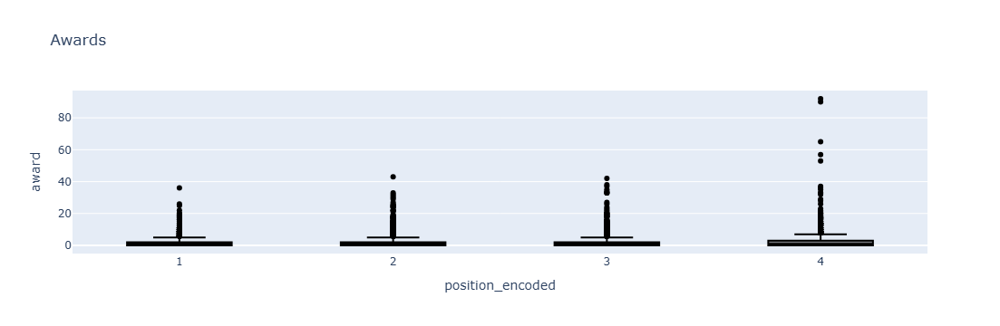

In [76]:
fig = px.box(df,x= 'position_encoded', y='award', title='Awards',color_discrete_sequence=px.colors.sequential.Blackbody)
fig.show()

In [77]:
df = df[df['award'] < 30]

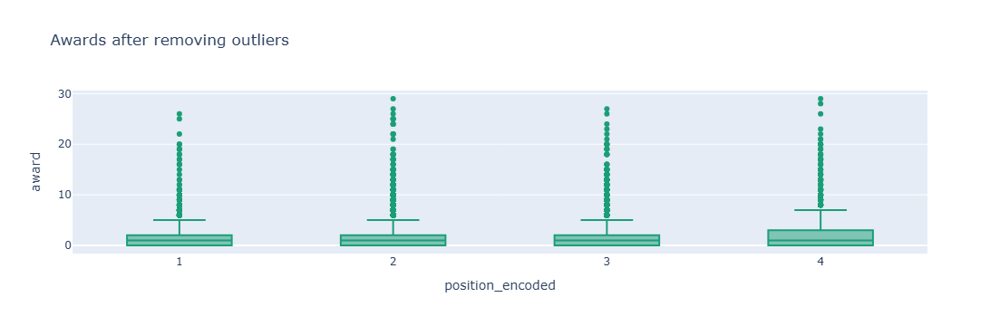

In [80]:
fig = px.box(df, x='position_encoded',y='award', title='Awards after removing outliers',color_discrete_sequence=px.colors.colorbrewer.Dark2)
# Show the plot
fig.show()

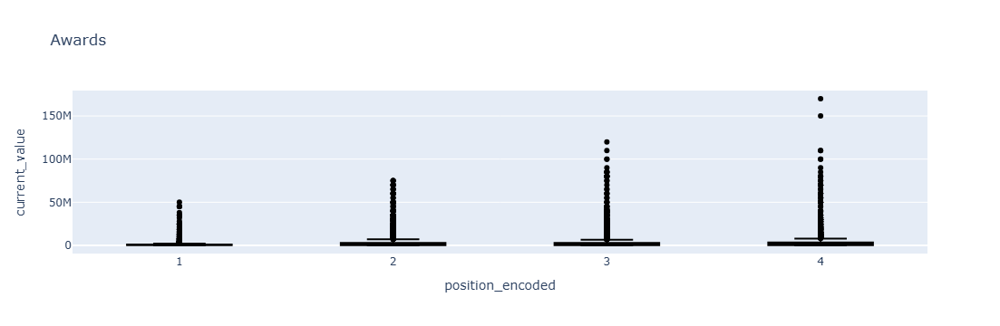

In [83]:
fig = px.box(df,x= 'position_encoded', y='current_value', title='Awards',color_discrete_sequence=px.colors.sequential.Blackbody)
fig.show()

In [84]:
df = df[~((df['current_value'] == 0) | (df['highest_value'] == 0))]

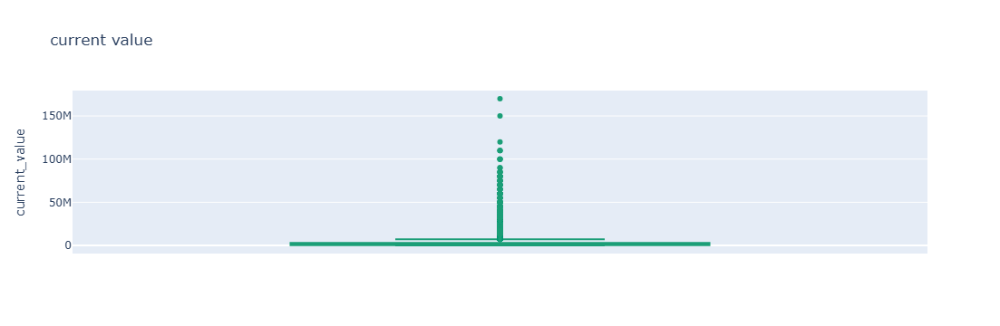

In [85]:
fig = px.box(df,y='current_value', title='current value',color_discrete_sequence=px.colors.colorbrewer.Dark2)
# Show the plot
fig.show()

In [88]:
df = df[df['current_value'] >= 40000]

In [89]:
df = df[df['current_value'] <= 50000000]

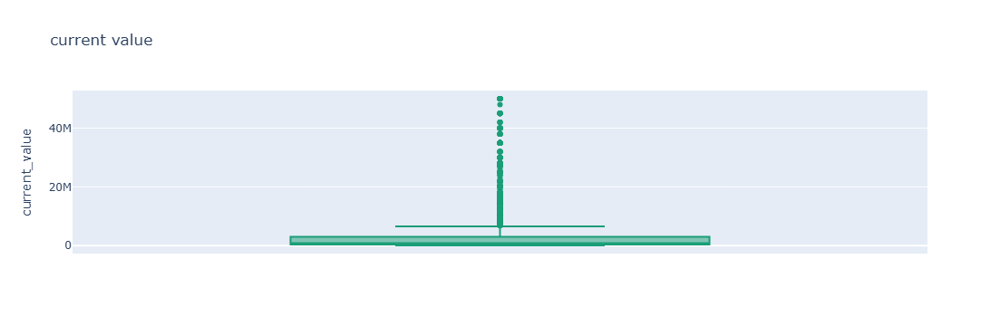

In [93]:
fig = px.box(df,y='current_value', title='current value',color_discrete_sequence=px.colors.colorbrewer.Dark2)
# Show the plot
fig.show()

In [94]:
df.shape

(9909, 20)

In [97]:
df.describe()

,height,age,appearance,goals,assists,yellow cards,second yellow cards,red cards,goals conceded,clean sheets,minutes played,days_injured,games_injured,award,current_value,highest_value,position_encoded,winger
count,9909.000000,9909.000000,9909.000000,9909.000000,9909.000000,9909.000000,9909.000000,9909.000000,9909.000000,9909.000000,9909.000000,9909.000000,9909.000000,9909.000000,9.909000e+03,9.909000e+03,9909.000000,9909.000000
mean,181.239563,26.167647,38.145827,0.122892,0.082722,0.174061,0.004282,0.004790,0.115612,0.027398,2586.299425,122.310021,16.362600,1.891916,3.246311e+06,5.726741e+06,2.727016,0.313251
std,6.982140,4.654434,25.725701,0.172860,0.102818,0.146870,0.016507,0.017190,0.386382,0.095878,1972.295986,177.717170,23.649861,3.063077,6.331741e+06,1.085100e+07,0.971255,0.463839
min,156.000000,15.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000e+04,5.000000e+04,1.000000,0.000000
25%,176.000000,22.000000,14.000000,0.000000,0.000000,0.067399,0.000000,0.000000,0.000000,0.000000,846.000000,0.000000,0.000000,0.000000,3.500000e+05,5.000000e+05,2.000000,0.000000
50%,181.240353,26.000000,38.000000,0.052250,0.047211,0.155709,0.000000,0.000000,0.000000,0.000000,2284.000000,44.000000,6.000000,1.000000,8.500000e+05,1.500000e+06,3.000000,0.000000
75%,186.000000,30.000000,59.000000,0.178660,0.134904,0.248902,0.000000,0.000000,0.000000,0.000000,4051.000000,187.000000,25.000000,2.000000,3.000000e+06,5.500000e+06,4.000000,1.000000
max,206.000000,42.000000,107.000000,1.184211,0.593407,0.994475,0.270270,0.286624,2.800000,0.924658,9510.000000,2349.000000,339.000000,29.000000,5.000000e+07,1.500000e+08,4.000000,1.000000


## Feature selection

In [105]:
df_dbscan = df[['position_encoded','yellow cards','current_value', 'goals','assists','goals conceded']]

## Import necessary libraries

In [125]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
from sklearn.svm import SVC
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors

In [109]:
# Prepare data
X = df_dbscan

# sacle the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [270]:
# sacle the data


In [111]:
X_scaled.shape

(9909, 6)

In [113]:
X.shape

(9909, 6)

## Build Unsupervised Learning Model (DBSCAN)

In [168]:
min_samples = 5



In [170]:
nn = NearestNeighbors(n_neighbors=min_samples)
nn.fit(X_scaled)
distances, indices = nn.kneighbors(X_scaled)

In [172]:
distances[:,min_samples-1]

array([0.55737987, 0.1586167 , 0.11558198, ..., 0.30162762, 0.27860648,
       0.28388432])

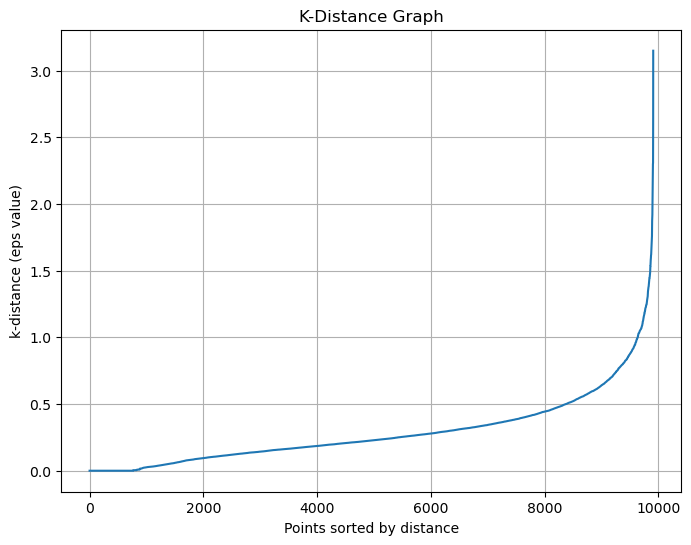

In [174]:
# The distance to the furthest neighbor (min_samples-th nearest) for each point
k_dist = distances[:, min_samples-1]

# Sort distances
k_dist_sorted = np.sort(k_dist)

# 3. Plotting the k-distance graph
plt.figure(figsize=(8, 6))
plt.plot(k_dist_sorted)
plt.title('K-Distance Graph')
plt.xlabel('Points sorted by distance')
plt.ylabel('k-distance (eps value)')
plt.grid(True)
plt.show()

In [185]:
chosen_eps = 1 # This is an example; choose this value based on the plot
dbscan = DBSCAN(eps=chosen_eps, min_samples=min_samples)

## Training the Model

In [188]:
# Fit the model on the training data

clusters = dbscan.fit_predict(X_scaled)

In [189]:
pd.Series(clusters).value_counts()

 1    3318
 2    2811
 3    2601
 0    1006
-1     157
 6       6
 4       5
 5       5
Name: count, dtype: int64

In [190]:
silhouette_avg = silhouette_score(X, clusters)
silhouette_avg

-0.41963815436030455

In [191]:
X.head(2)

,position_encoded,yellow cards,current_value,goals,assists,goals conceded,dbscan
0,1,0.009585,15000000,0.0,0.0,1.217252,0
1,1,0.069018,1500000,0.0,0.0,1.242331,0


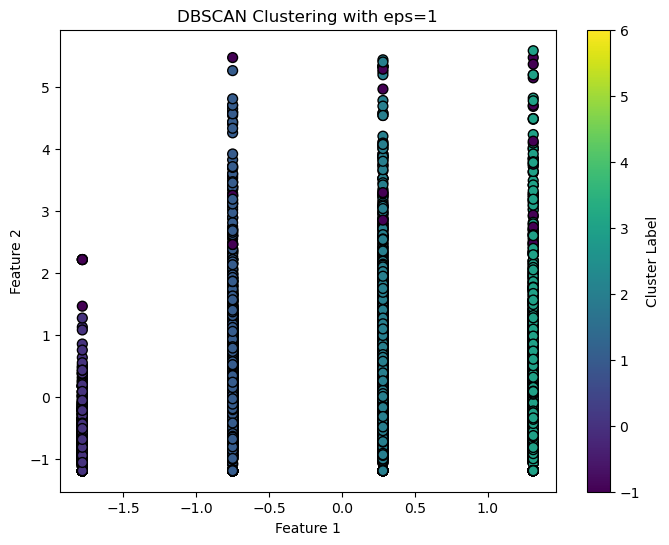

In [194]:
# 5. Plot the clustering result
plt.figure(figsize=(8, 6))
plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=clusters, cmap='viridis', s=50, edgecolor='k')
plt.title(f'DBSCAN Clustering with eps={chosen_eps}')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.colorbar(label='Cluster Label')
plt.show()

In [195]:
X['dbscan'] = clusters


C:\Users\User\AppData\Local\Temp\ipykernel_15524\4044694286.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [200]:
X['dbscan'].value_counts()

dbscan
 1    3318
 2    2811
 3    2601
 0    1006
-1     157
 6       6
 4       5
 5       5
Name: count, dtype: int64

<Axes: xlabel='current_value', ylabel='position_encoded'>

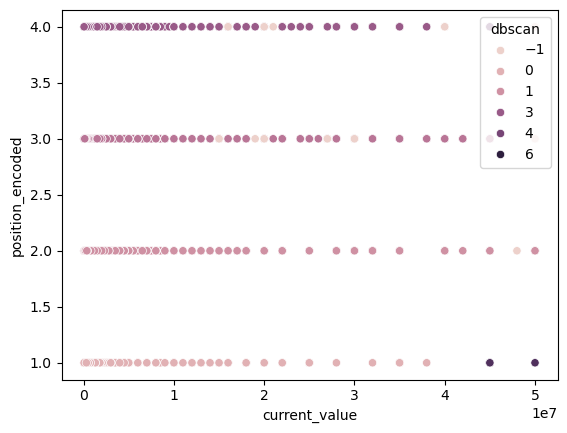

In [202]:
sns.scatterplot(data = X , x = 'current_value', y = 'position_encoded', hue = 'dbscan')

<Axes: xlabel='goals', ylabel='position_encoded'>

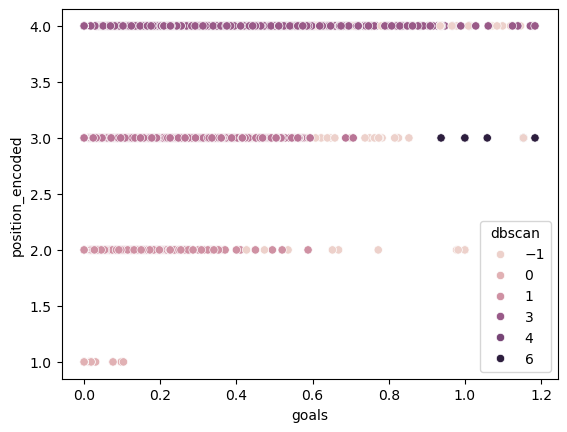

In [206]:
sns.scatterplot(data = X , x = 'goals', y = 'position_encoded', hue = 'dbscan')